# Logistic Regression

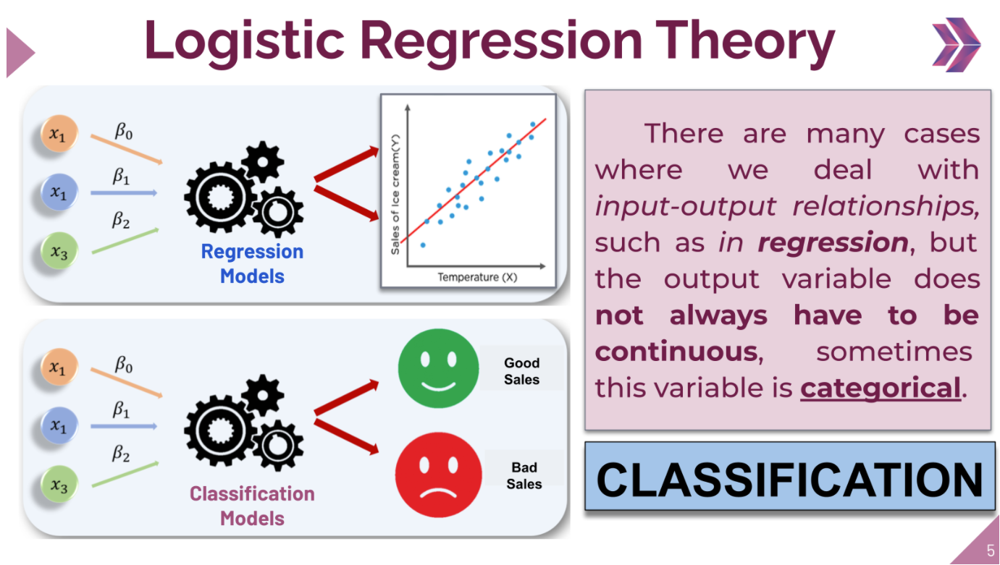

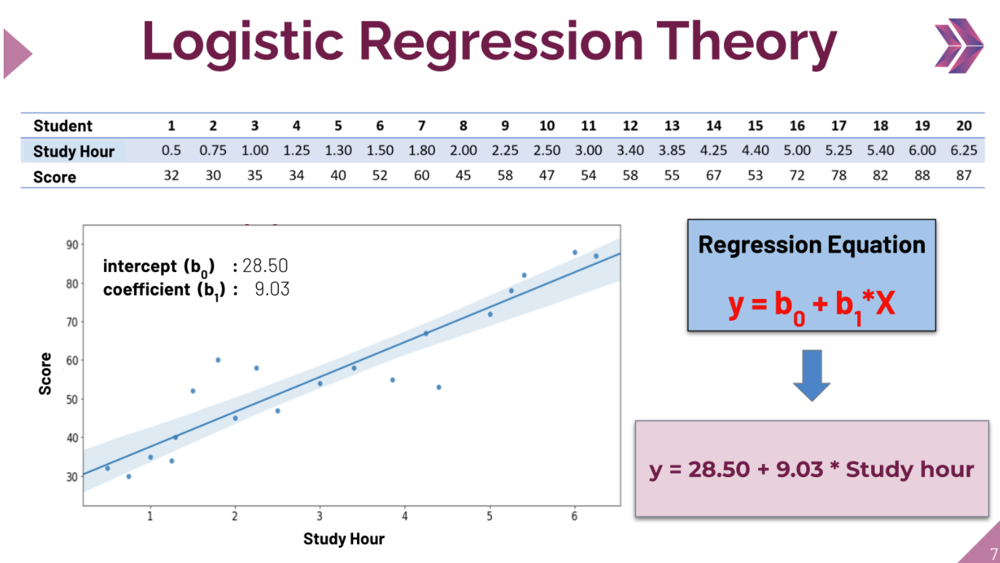

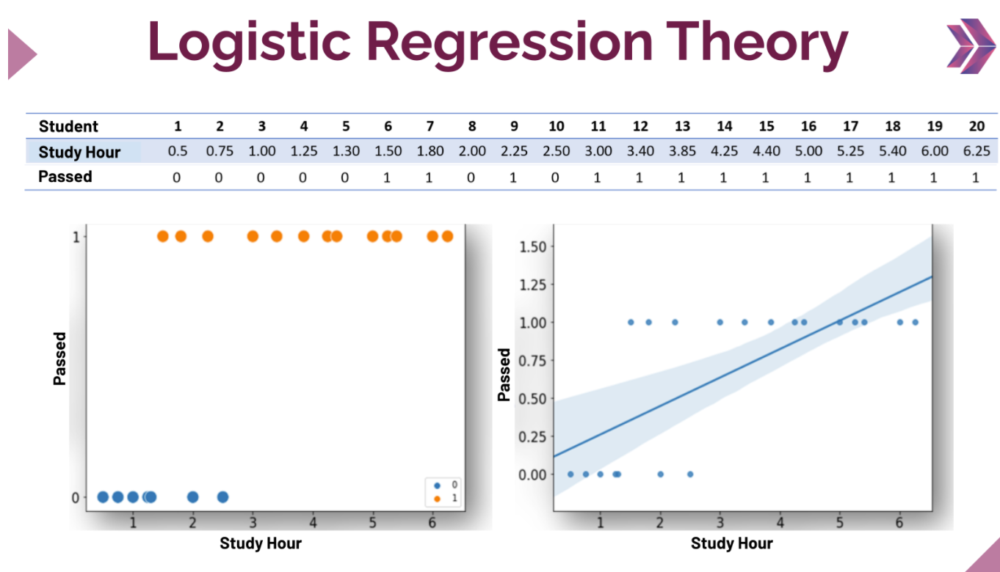

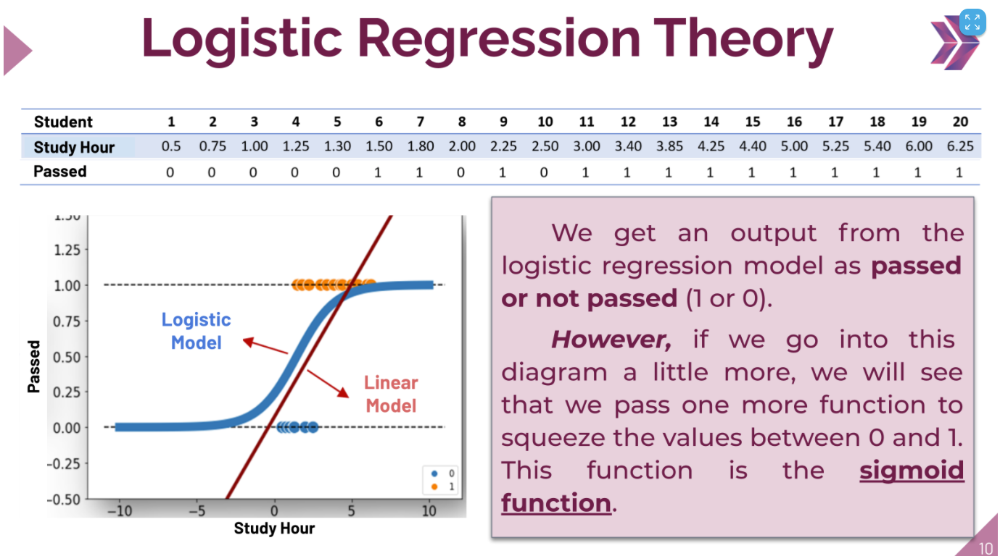

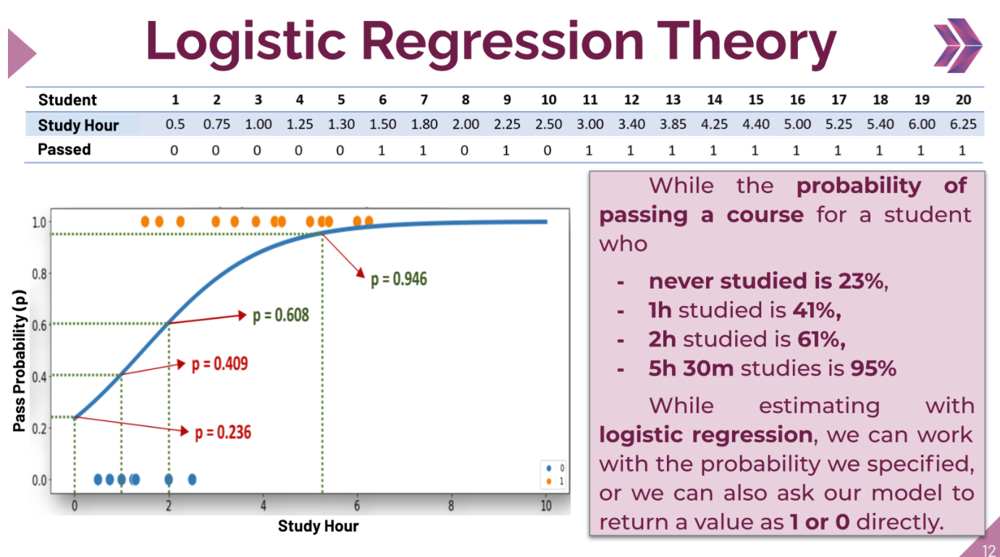

...

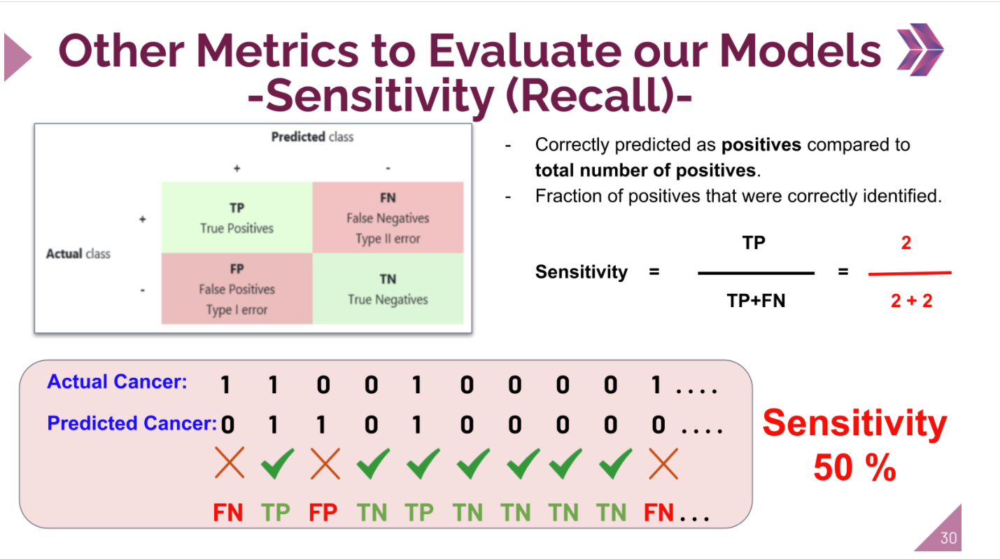

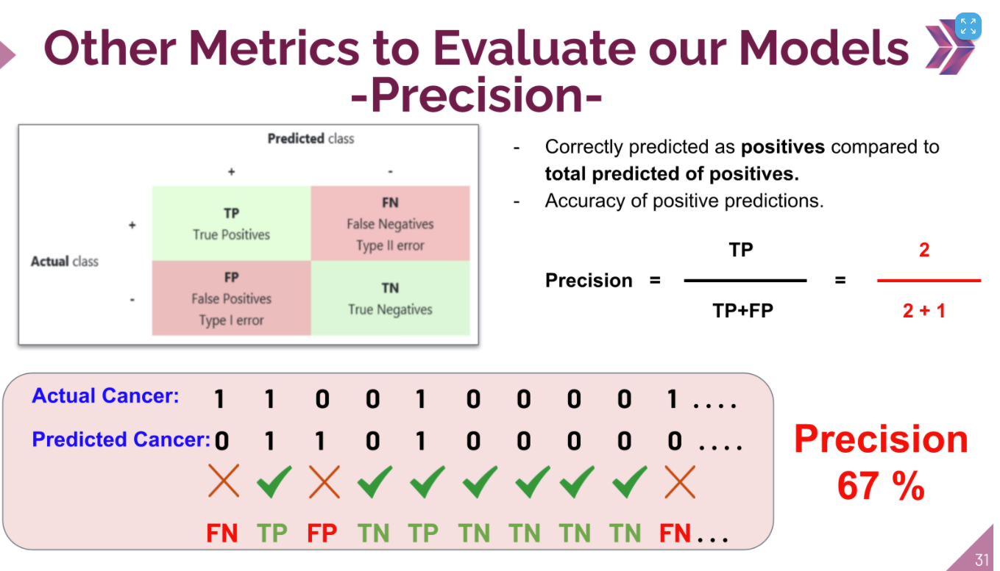

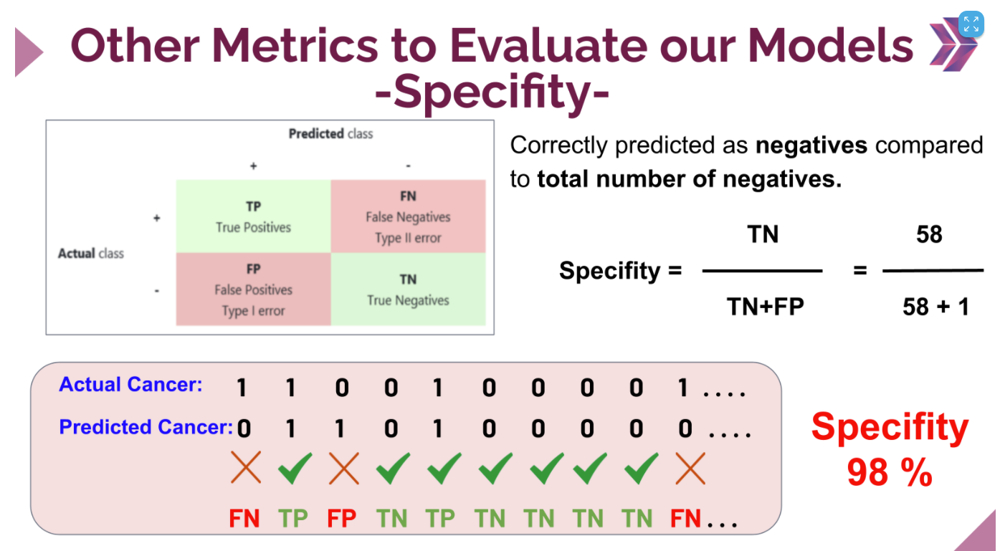

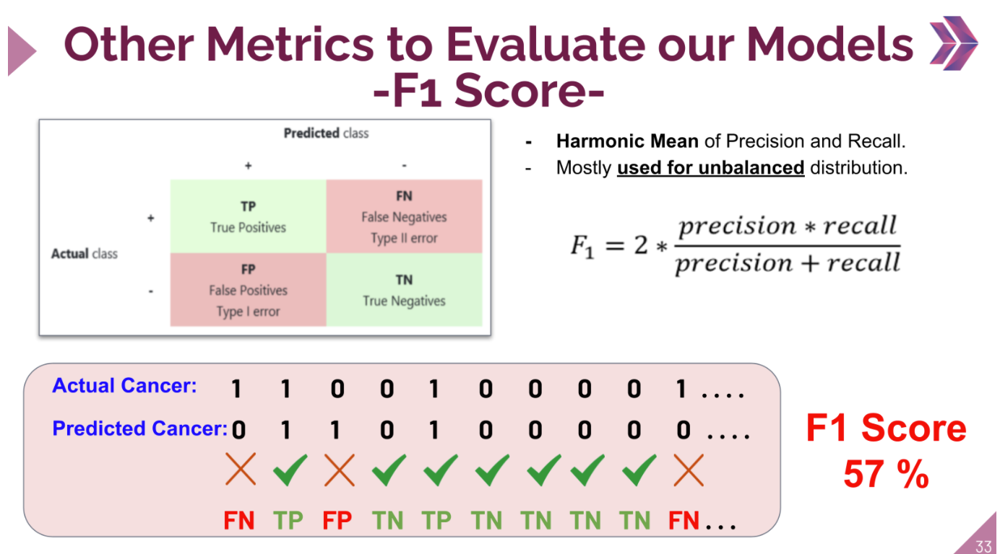

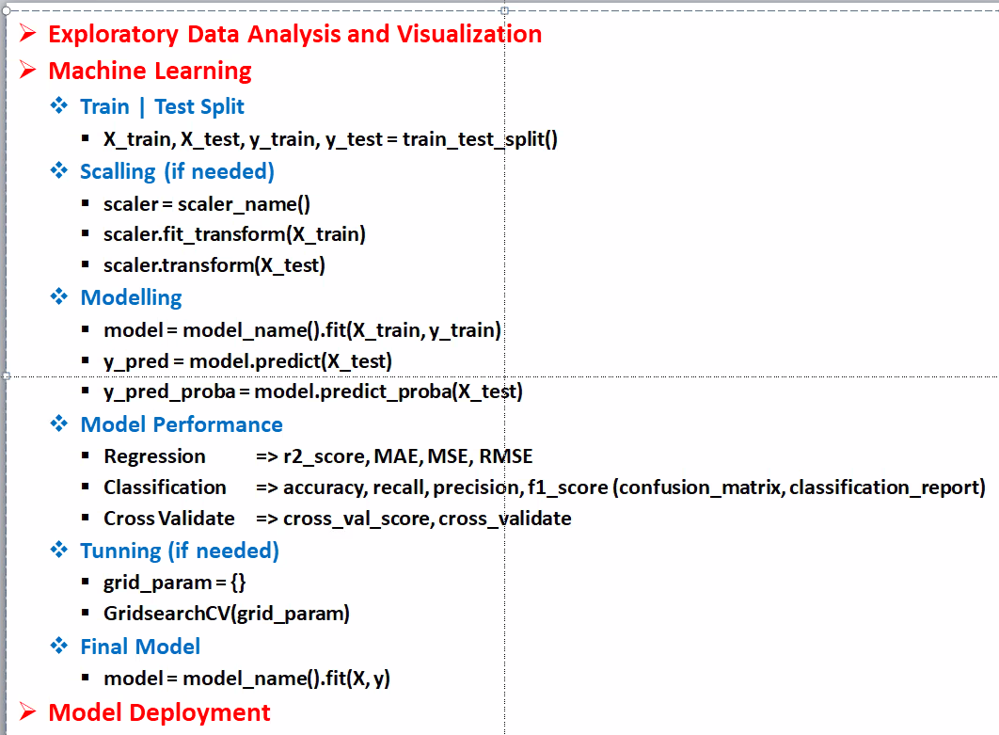

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline
#%matplotlib notebook
plt.rcParams["figure.figsize"] = (10,6)
import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")
pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [2]:
df = pd.read_csv('hearing_test.csv')

In [3]:
df.head()

,age,physical_score,test_result
0,33.000,40.700,1
1,50.000,37.200,1
2,52.000,24.700,0
3,56.000,31.000,0
4,35.000,42.900,1


## Exploratory Data Analysis and Visualization

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             5000 non-null   float64
 1   physical_score  5000 non-null   float64
 2   test_result     5000 non-null   int64  
dtypes: float64(2), int64(1)
memory usage: 117.3 KB


In [5]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,5000.000,51.609,11.287,18.000,43.000,51.000,60.000,90.000
physical_score,5000.000,32.760,8.170,-0.000,26.700,35.300,38.900,50.000
test_result,5000.000,0.600,0.490,0.000,0.000,1.000,1.000,1.000


In [6]:
df['test_result'].value_counts()

1    3000
0    2000
Name: test_result, dtype: int64

<AxesSubplot:>

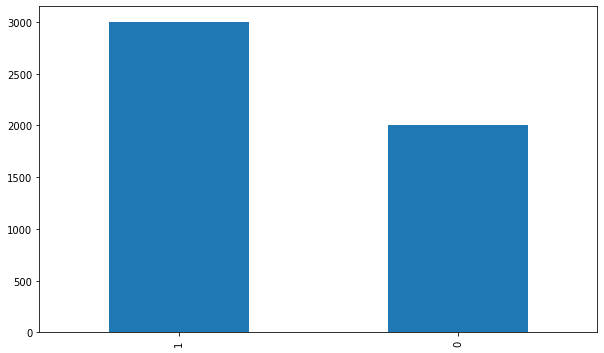

In [7]:
df['test_result'].value_counts().plot.bar()

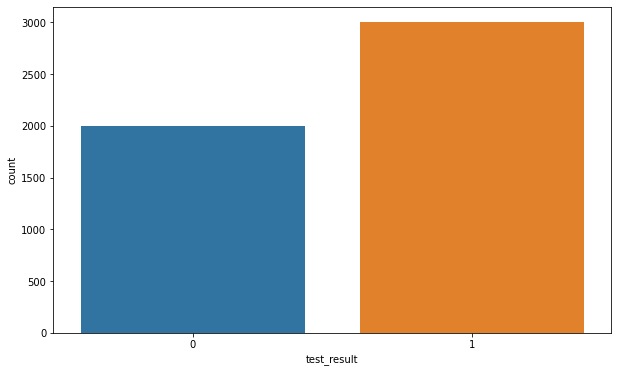

In [8]:
sns.countplot(df['test_result']);

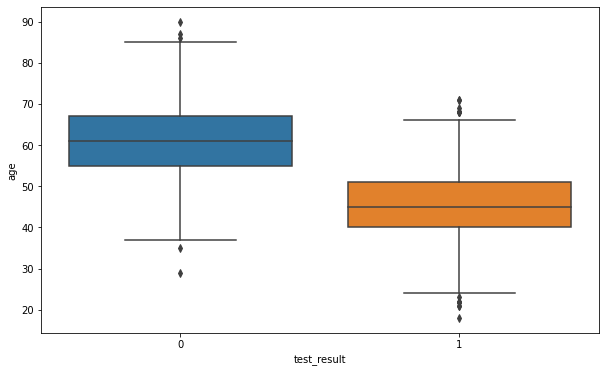

In [9]:
sns.boxplot(x='test_result', y='age', data=df);

# yaşı genç olanların testi geçme ihtimali daha fazla.

<AxesSubplot:xlabel='test_result', ylabel='physical_score'>

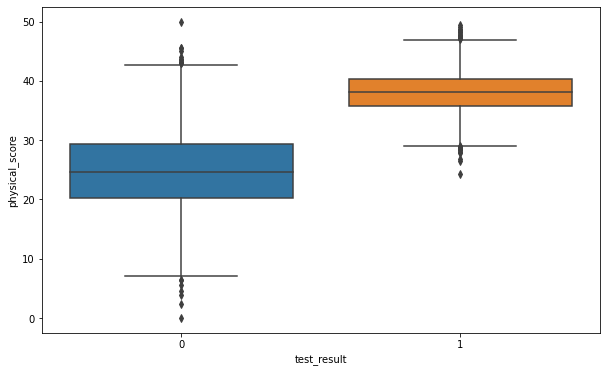

In [10]:
sns.boxplot(x='test_result',y='physical_score',data=df)

# fiziksel skora baktığımızda 25 civarı olanlar testi geçememiş. 
# fiziksel skorun yüksek olması, 1 olma durumunu 0 olma durumundan daha fazla belirliyor. 
# çünkü mutlak değeri daha büyük olanın modele etkisi genelde daha fazla olur 


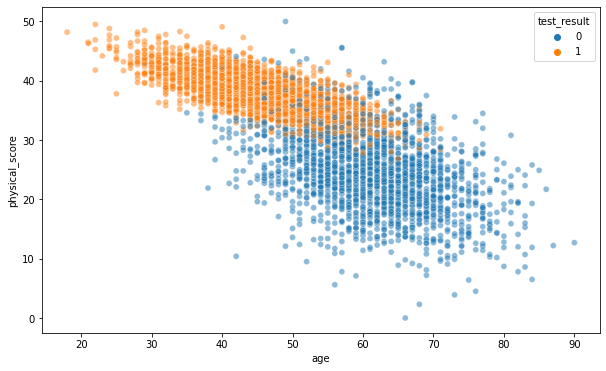

In [11]:
sns.scatterplot(x='age', y='physical_score', data=df, hue='test_result', alpha=0.5);

# hatalar genelde mavi ve turuncu(0 ve 1) nun kesiştiği yerlerde gözükmektedir. 

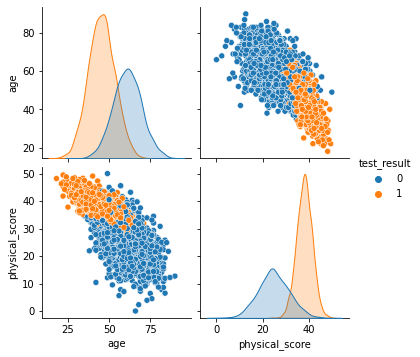

In [12]:
sns.pairplot(df, hue='test_result');

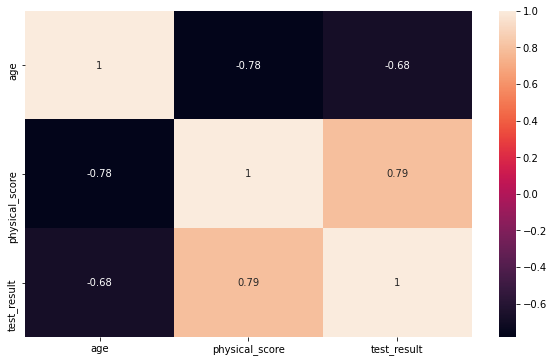

In [13]:
sns.heatmap(df.corr(), annot=True);

# heatmap ile correlasyonları görelim.

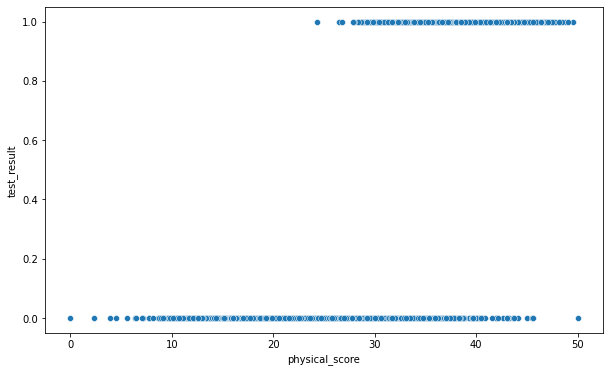

In [14]:
sns.scatterplot(x='physical_score',y='test_result',data=df);

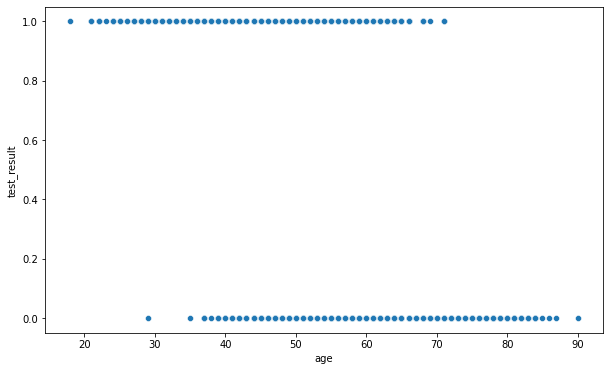

In [15]:
sns.scatterplot(x='age',y='test_result',data=df);

Easily discover new plot types with a google search! Searching for "3d matplotlib scatter plot" quickly takes you to: https://matplotlib.org/3.1.1/gallery/mplot3d/scatter3d.html

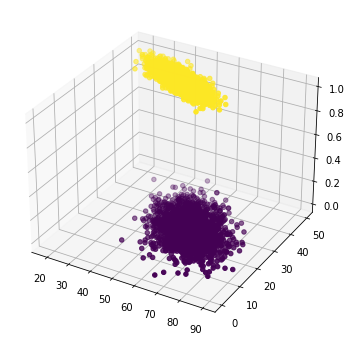

In [16]:
from mpl_toolkits.mplot3d import Axes3D 
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(df['age'],df['physical_score'],df['test_result'],c=df['test_result']);

In [17]:
#!pip install plotly

https://plotly.com/python/3d-scatter-plots/

In [18]:
import plotly.express as px
fig = px.scatter_3d(df, x='age', y='physical_score', z='test_result',
              color='test_result')
fig.show()

## Train | Test Split and Scaling

In [19]:
X = df.drop('test_result',axis=1)
y = df['test_result']

In [20]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [21]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=101)

# datanınız büyüklüğüne bağlı olarak train'e ne kadar büyük bölüm ayırırsanız o kadar sağlıklı sonuç alma olasılığınız yükselir.
# burada datam yeterli büyüklükte olmadığı için trainimin daha sağlıklı olması için yüzdesini arttırdım.

In [22]:
scaler = StandardScaler()

In [23]:
X_train_scaled = scaler.fit_transform(X_train)  # train datamı scale ederek fit uyguladık.
X_test_scaled = scaler.transform(X_test)   # test datamı scale ettik.

## Modelling

In [24]:
from sklearn.linear_model import LogisticRegression

https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html

In [25]:
#help(LogisticRegression)

In [26]:
log_model = LogisticRegression()

In [27]:
log_model.fit(X_train_scaled, y_train)

# scale i sadece feature lar üzerinde uyguluyoruz. target datam olan y value'larıma scale uygulamıyorum çünkü
# ML predicti sonucunda bana scale değeri değil gerçek hayattaki değerler lazım.

LogisticRegression()

In [28]:
log_model.coef_

array([[-0.94953524,  3.45991194]])

In [29]:
log_model.intercept_

array([0.48867341])

In [54]:
df.sample(10)

,age,physical_score,test_result
1259,77.000,11.400,0
4768,51.000,28.500,0
4878,50.000,34.600,1
185,46.000,41.200,1
1347,51.000,35.600,0
1621,58.000,27.700,0
4637,49.000,39.100,1
3581,29.000,45.300,1
2385,35.000,42.800,1
3244,44.000,32.300,0


In [31]:
y_pred = log_model.predict(X_test_scaled)
y_pred

array([1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1,
       0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0,
       0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1,
       0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0,
       0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1,
       1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1,
       1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1,
       1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1,
       1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1,
       0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0,
       1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1,
       1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1,
       1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1,
       1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1,

In [32]:
y_pred_proba = log_model.predict_proba(X_test_scaled)
y_pred_proba

# predict_proba() fonksiyonu, predict sonucu olan 0 ve 1 lerin probability'sini veriyor.

# her bir X_test değeri için predict edilen değerin 0 ve 1 olma ihtimallerini veren fonksiyondur.
# dolayısıyla birinci ve ikinci değerin toplamı 1 e eşittir. Burada ilk değer 0'ın, ikinci değer 1'in probabilitisidir.

# (2.38434328e-02 + 9.76156567e-01 = 1)

array([[2.38434328e-02, 9.76156567e-01],
       [2.69240761e-02, 9.73075924e-01],
       [9.89194168e-01, 1.08058325e-02],
       [1.90768955e-03, 9.98092310e-01],
       [9.75012619e-01, 2.49873806e-02],
       [9.89652504e-01, 1.03474957e-02],
       [7.40226674e-02, 9.25977333e-01],
       [1.70943342e-02, 9.82905666e-01],
       [9.97066033e-01, 2.93396692e-03],
       [3.30521615e-02, 9.66947839e-01],
       [8.31035903e-02, 9.16896410e-01],
       [9.92865306e-03, 9.90071347e-01],
       [7.08965218e-03, 9.92910348e-01],
       [9.34236379e-01, 6.57636209e-02],
       [1.16594927e-04, 9.99883405e-01],
       [6.58904151e-02, 9.34109585e-01],
       [9.89126706e-01, 1.08732938e-02],
       [2.80051357e-03, 9.97199486e-01],
       [5.58920624e-04, 9.99441079e-01],
       [9.96523291e-01, 3.47670946e-03],
       [8.81757060e-01, 1.18242940e-01],
       [1.31030473e-01, 8.68969527e-01],
       [5.45646751e-01, 4.54353249e-01],
       [3.44064171e-02, 9.65593583e-01],
       [3.983864

In [33]:
# X_test + y_yest + y_pred_proba + y_pred

In [34]:
X_test

,age,physical_score
1718,39.000,37.800
2511,45.000,38.700
345,56.000,21.800
2521,40.000,44.000
54,64.000,25.400
...,...,...
4770,46.000,37.700
188,59.000,36.500
3335,54.000,22.800
4583,58.000,20.500


In [35]:
df.columns

Index(['age', 'physical_score', 'test_result'], dtype='object')

In [36]:
test_data = pd.concat([X_test, y_test], axis=1)
test_data

,age,physical_score,test_result
1718,39.000,37.800,1
2511,45.000,38.700,1
345,56.000,21.800,0
2521,40.000,44.000,1
54,64.000,25.400,0
...,...,...,...
4770,46.000,37.700,1
188,59.000,36.500,1
3335,54.000,22.800,0
4583,58.000,20.500,0


In [37]:
test_data["pred_proba"] = y_pred_proba[:,1] 
test_data

# y_pred_proba'nın tüm satırları ile (1.indekse karşılık gelen) 2.sütununu yani 1 olma ihtimalinin değerlerini getirdik.

,age,physical_score,test_result,pred_proba
1718,39.000,37.800,1,0.976
2511,45.000,38.700,1,0.973
345,56.000,21.800,0,0.011
2521,40.000,44.000,1,0.998
54,64.000,25.400,0,0.025
...,...,...,...,...
4770,46.000,37.700,1,0.956
188,59.000,36.500,1,0.813
3335,54.000,22.800,0,0.019
4583,58.000,20.500,0,0.005


In [38]:
test_data["pred"] = y_pred
test_data

# y_pred, yani y_test'in predict değerleri ile test_result columnu yani y değerini karşılaştırıyoruz.

,age,physical_score,test_result,pred_proba,pred
1718,39.000,37.800,1,0.976,1
2511,45.000,38.700,1,0.973,1
345,56.000,21.800,0,0.011,0
2521,40.000,44.000,1,0.998,1
54,64.000,25.400,0,0.025,0
...,...,...,...,...,...
4770,46.000,37.700,1,0.956,1
188,59.000,36.500,1,0.813,1
3335,54.000,22.800,0,0.019,0
4583,58.000,20.500,0,0.005,0


In [39]:
test_data.sample(10)

,age,physical_score,test_result,pred_proba,pred
3699,38.000,43.300,1,0.998,1
4080,75.000,13.800,0,0.000,0
3536,62.000,23.200,0,0.012,0
3940,50.000,38.100,1,0.948,1
2439,55.000,36.000,1,0.832,1
484,48.000,35.500,1,0.878,1
3344,55.000,35.800,1,0.819,1
3632,53.000,36.500,1,0.878,1
3973,54.000,22.100,0,0.014,0
508,78.000,21.800,0,0.002,0


## Model Performance on Classification Tasks

In [40]:
from sklearn.metrics import confusion_matrix, classification_report, plot_confusion_matrix

In [44]:
confusion_matrix(y_test,y_pred)  

# 172 true negative
# 293 true positive

# y_test, true(1) ve false (0) değerlerden oluşan actual (gerçek) değerlerimiz idi. 
# bunu y_pred ile yani logistic regression ile bulduğumuz prediction değerleri ile birlikte confusion_matrix() fonk.na sokarak
# True pos., True neg., False pos. ve False neg. lerin sayısını buluyoruz.

array([[172,  21],
       [ 14, 293]], dtype=int64)

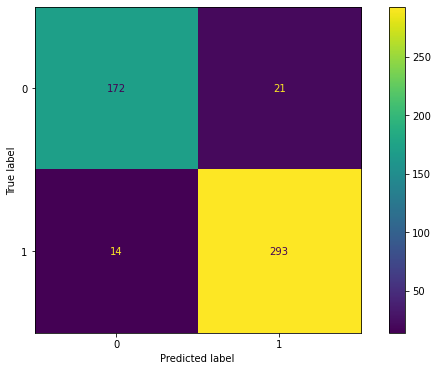

In [43]:
# modelimizi yukarda log_model = LogisticRegression() ile tanımlamıştık.
# bu object'i (scaled edilmiş) x_test değerlerim ve actual y_test değerlerim ile birlikte plot_confusion_matrix() fonksiyonuna sokuyorum.

plot_confusion_matrix(log_model, X_test_scaled, y_test);

# bu kodu çalıştırmak için prediction yapmaya gerek yok. modeli train yaptıktan sonra bu kodu çalıştırabilirsin.

# plot_confusion_matrix fonksiyonunun da confusion_matrix fonk.daki parametreleri almasını beklerdik fakat farklı parametreleri almış.
# y_pred değerinin --> y_pred = log_model.prediciton(X_test_scaled) den geldiğini düşünürsek. aslında plot_confusion_matrix'in 
# içine yine confusion_matrix fonksiyonu gibi y_test ve y_pred değerlerini almış olduğunu anlıyoruz.

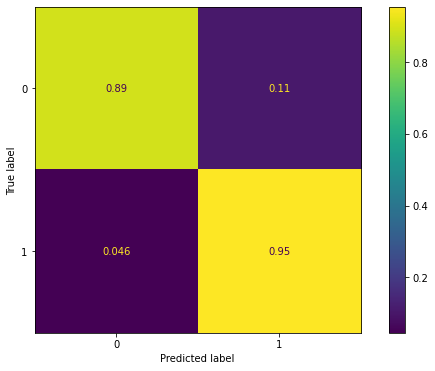

In [51]:
plot_confusion_matrix(log_model, X_test_scaled, y_test, normalize='true');

# yukardaki bize sayıları verirken bu bize oranları veriyor. 

# ilk satır, 0 ların yüzde 89 unu kaçını bilmişim, yüzde 11'ini  bilememişim.
# ikinci satır, 1 lerin yüzde 0.95 ini bilmişim, yüzde 0.46 sını bilememişim.

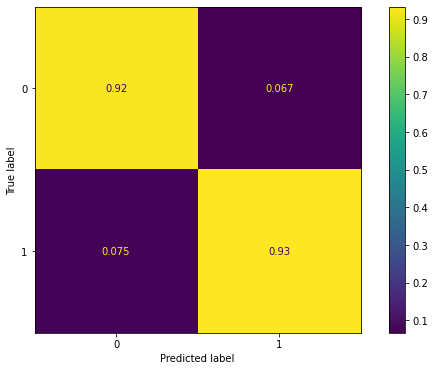

In [49]:
plot_confusion_matrix(log_model, X_test_scaled, y_test, normalize='pred');


#  pozitif VE negatif olarak tahmin ettiklerimin YÜZDE kaçı doğru / yanlış

   # toplam negatif tahminlerimin % 92 si doğru, % 0.67 si yanlış
   # toplam pozitif tahminlerimin % 93 ü doğru, % 0.75 i yanlış
   

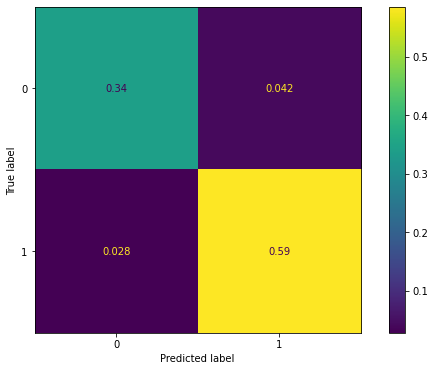

In [47]:
plot_confusion_matrix(log_model, X_test_scaled, y_test, normalize='all');

# yukarda normalize parametresini kullanmadan bulduğum (sayısal) değerlerin toplama (500'e) bölümü

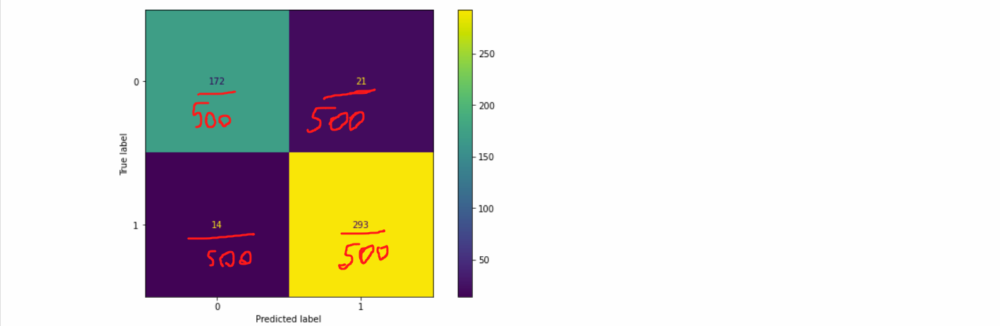

In [48]:
print(classification_report(y_test,y_pred))

# aşağıda 0'ı veya 1'i baz alarak hipotezi ortaya koyduğundaki değerleri veriyor. 
# hem 0 hem de 1 bakış açısına göre değerler aşağıda..

# recall diyor ki; gerçekte 1 olanların yüzde kaçını doğru tahmin ettim.
# precision diyor ki; benim 1 tahmin ettiklerimin yüzde kaçı doğru.

              precision    recall  f1-score   support

           0       0.92      0.89      0.91       193
           1       0.93      0.95      0.94       307

    accuracy                           0.93       500
   macro avg       0.93      0.92      0.93       500
weighted avg       0.93      0.93      0.93       500



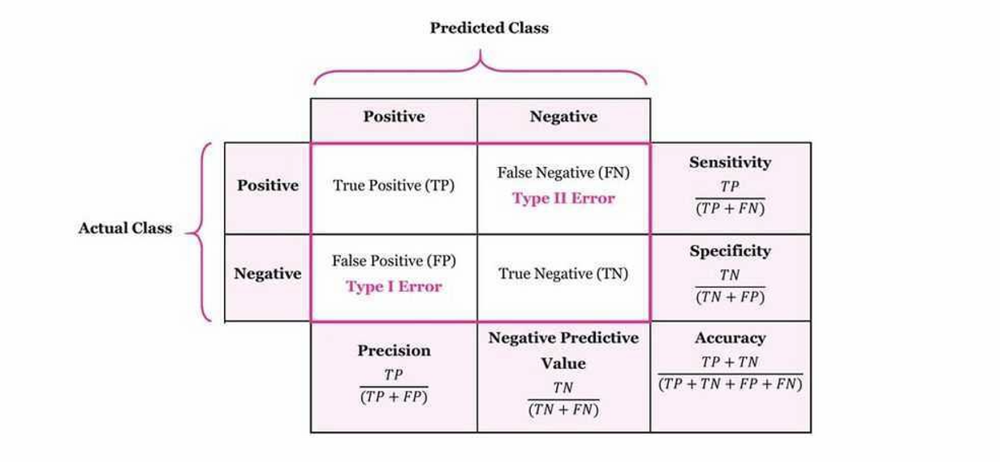

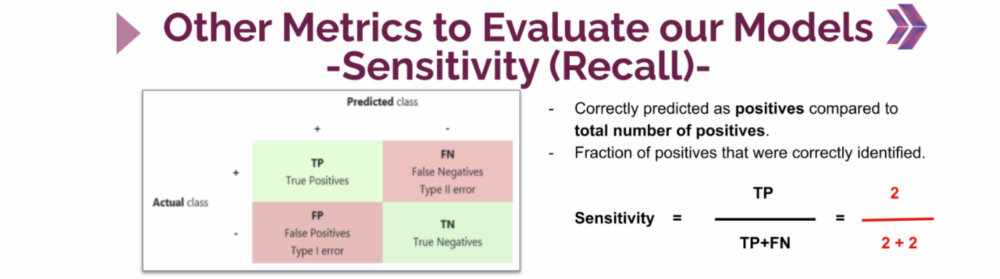

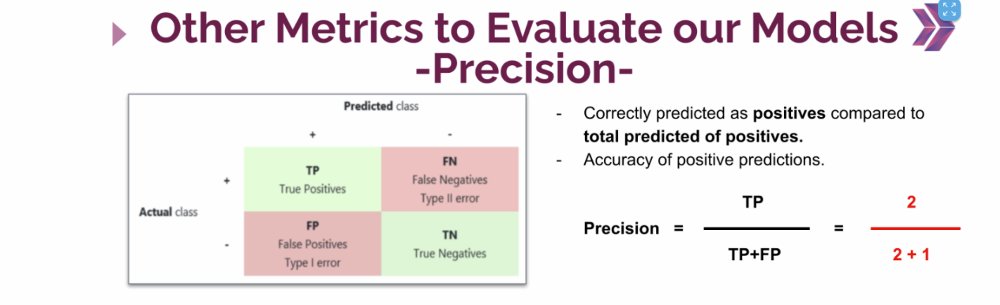

In [ ]:
#pip install yellowbrick

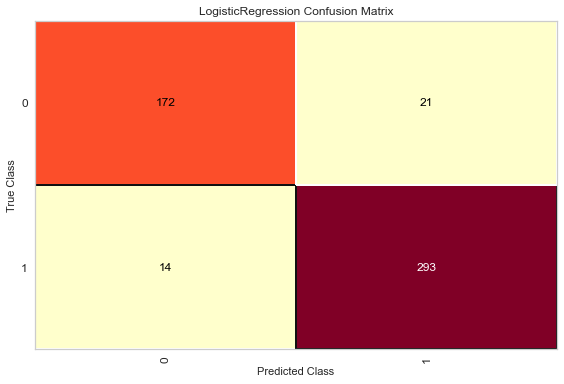

<AxesSubplot:title={'center':'LogisticRegression Confusion Matrix'}, xlabel='Predicted Class', ylabel='True Class'>

In [65]:
from yellowbrick.classifier import ConfusionMatrix
# The ConfusionMatrix visualizer taxes a model
cm = ConfusionMatrix(log_model)
# Fit trains the passed model. This is unnecessary if you pass the visualizer a pre-fitted model
cm.fit(X_train_scaled, y_train)
# To create the ConfusionMatrix, we need some test data. Score runs predict() on the data
# and then creates the confusion_matrix from scikit-learn.
cm.score(X_test_scaled, y_test)
cm.show()

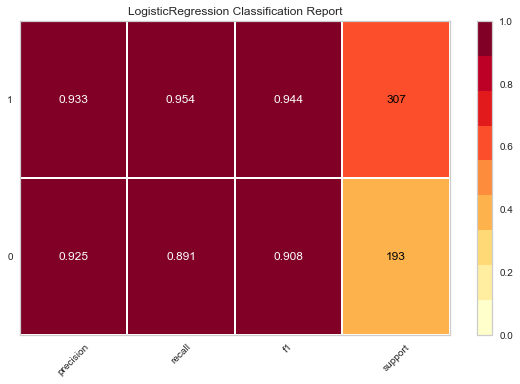

<AxesSubplot:title={'center':'LogisticRegression Classification Report'}>

In [81]:
from yellowbrick.classifier import ClassificationReport

visualizer = ClassificationReport(log_model, support=True)
visualizer.fit(X_train_scaled, y_train)        # Fit the visualizer and the model
visualizer.score(X_test_scaled, y_test)        # Evaluate the model on the test data
visualizer.show()

# visualizer.score(X_test_scaled, y_test) içinde aşağıdaki skorları tutup görselleştirdiği gibi 
# aynı zamanda görselde göstermese de accuracy skorunu da içinde generate ediyor.
# show() veya ; kullanmadığında generate ettiği bu accuracy değerini grafiğin üzerinde görebiliyoruz.

In [66]:
from sklearn.metrics import precision_score, recall_score, accuracy_score, f1_score

In [70]:
accuracy_score(y_test,y_pred)

0.93

In [68]:
log_model.score(X_test_scaled, y_test)

# bu da accuracy skorunu verir ????????????

0.93

In [71]:
precision_score(y_test, y_pred)

# precision_score() fonksiyonunda default olarak pos_label=1 dir. eğer 0 a göre değer getirsin istersen 0 yapmalısın.

0.9331210191082803

In [82]:
recall_score(y_test, y_pred)

0.9543973941368078

In [83]:
f1_score(y_test,y_pred, average = "weighted")

0.9297480869650194

## Cross Validate

In [85]:
from sklearn.model_selection import cross_val_score, cross_validate

In [86]:
model = LogisticRegression()

scores = cross_val_score(model, X_train_scaled, y_train, cv=10)
print('Cross-Validation of Accuracy Scores', scores.mean())
print("")
print(scores)

# scores dediğimiz zaman default olarak Accuracy demek olduğunu bileceğiz.

Cross-Validation Mean of Accuracy Scores 0.9146666666666666

[0.9        0.92444444 0.93555556 0.93111111 0.93777778 0.90222222
 0.89777778 0.91111111 0.89111111 0.91555556]


In [87]:
model = LogisticRegression()

scores = cross_val_score(model, X_train_scaled, y_train, cv=10, scoring="f1_weighted")
print('Cross-Validation Mean of f1_weighted Scores', scores.mean())
print("")
print(scores)

Cross-Validation Mean of f1_weighted Scores 0.9142157347468058

[0.89891354 0.92405195 0.93485539 0.93101428 0.93765977 0.90261051
 0.89675804 0.91010501 0.89115971 0.91502915]


In [94]:
model = LogisticRegression()

scores = cross_val_score(model, X_train_scaled, y_train, cv=10, scoring="recall")
print('Cross-Validation Mean of recall Scores', scores.mean())
print("")
print(scores)

Cross-Validation Mean of recall Scores 0.9461379595208591

[0.95185185 0.95555556 0.98148148 0.94795539 0.95539033 0.89962825
 0.94795539 0.96282528 0.9070632  0.95167286]


In [92]:
import sklearn
sklearn.metrics.SCORERS.keys()

dict_keys(['explained_variance', 'r2', 'max_error', 'neg_median_absolute_error', 'neg_mean_absolute_error', 'neg_mean_absolute_percentage_error', 'neg_mean_squared_error', 'neg_mean_squared_log_error', 'neg_root_mean_squared_error', 'neg_mean_poisson_deviance', 'neg_mean_gamma_deviance', 'accuracy', 'top_k_accuracy', 'roc_auc', 'roc_auc_ovr', 'roc_auc_ovo', 'roc_auc_ovr_weighted', 'roc_auc_ovo_weighted', 'balanced_accuracy', 'average_precision', 'neg_log_loss', 'neg_brier_score', 'adjusted_rand_score', 'rand_score', 'homogeneity_score', 'completeness_score', 'v_measure_score', 'mutual_info_score', 'adjusted_mutual_info_score', 'normalized_mutual_info_score', 'fowlkes_mallows_score', 'precision', 'precision_macro', 'precision_micro', 'precision_samples', 'precision_weighted', 'recall', 'recall_macro', 'recall_micro', 'recall_samples', 'recall_weighted', 'f1', 'f1_macro', 'f1_micro', 'f1_samples', 'f1_weighted', 'jaccard', 'jaccard_macro', 'jaccard_micro', 'jaccard_samples', 'jaccard_wei

In [95]:
model = LogisticRegression()

scores = cross_validate(model, X_train_scaled, y_train, scoring = ['accuracy', 'precision_weighted','recall_weighted',
                                                                   'f1_weighted'], cv = 10)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores

,fit_time,score_time,test_accuracy,test_precision_weighted,test_recall_weighted,test_f1_weighted
1,0.011,0.007,0.900,0.901,0.900,0.899
2,0.011,0.004,0.924,0.925,0.924,0.924
3,0.009,0.006,0.936,0.938,0.936,0.935
4,0.009,0.004,0.931,0.931,0.931,0.931
5,0.008,0.004,0.938,0.938,0.938,0.938
6,0.010,0.006,0.902,0.904,0.902,0.903
7,0.009,0.006,0.898,0.899,0.898,0.897
8,0.009,0.009,0.911,0.913,0.911,0.910
9,0.008,0.007,0.891,0.891,0.891,0.891
10,0.010,0.004,0.916,0.916,0.916,0.915


In [96]:
df_scores.mean()[2:]

test_accuracy             0.915
test_precision_weighted   0.916
test_recall_weighted      0.915
test_f1_weighted          0.914
dtype: float64

## ROC (Receiver Operating Curve) and AUC (Area Under Curve)

Purpose of ROC Curve:

    1. Analysing the strength/predictive power of a classifier. (Bir sınıflandırıcının gücünü/tahmin gücünü analiz etme)
    2. Determining optimal threshold.(Optimum eşiğin belirlenmesi)
    3. Comparing two models (using Area Under the Curve).
   

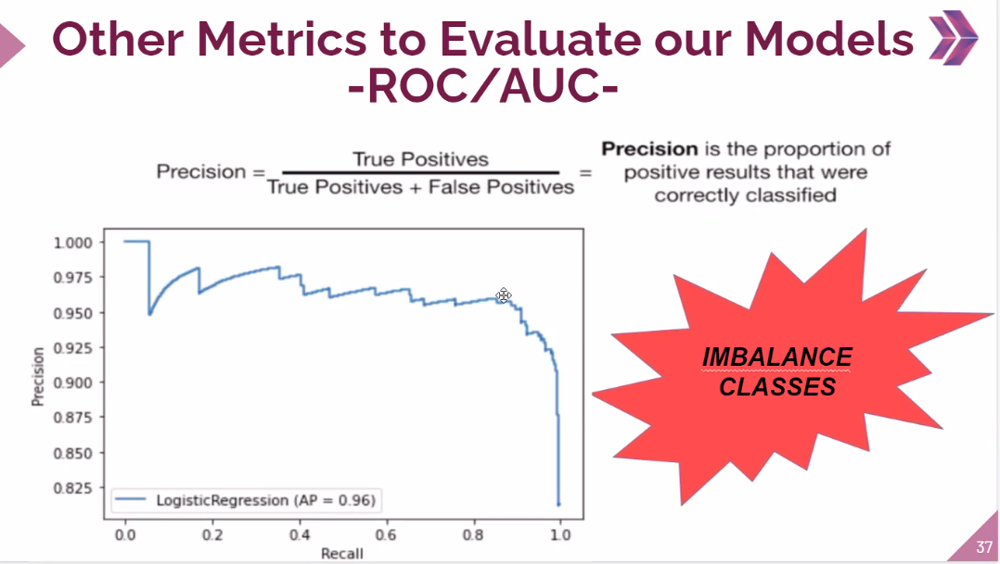

AUC represents a degree or measure of separability. It tells us how much the model is capable of distinguishing between classes. Higher the AUC, better the model is at predicting the probability of class YES higher than the probability of class NO.

The ROC Curve was first used during World War II for the analysis of radar signals. After the attack on Pearl Harbor, the US army began new research to improve the rate of detection of Japanese aircraft from their radar signals. Needless to say, they did not want to miss any of them. Neither did they wish to waste their resources on false alarms. They measured the ability of a radar receiver operator to make these predictions called the Receiver Operating Characteristic. That is the origin of the name. The purpose of the curve was similar to how we use it to improve our machine learning models now. The aim was to analyse the predictive power of the predictor in ensuring the detection of as many true positives as possible while minimizing false positives.

https://towardsdatascience.com/demystifying-roc-curves-df809474529a

In [97]:
from sklearn.metrics import plot_roc_curve, plot_precision_recall_curve, roc_auc_score, auc, roc_curve

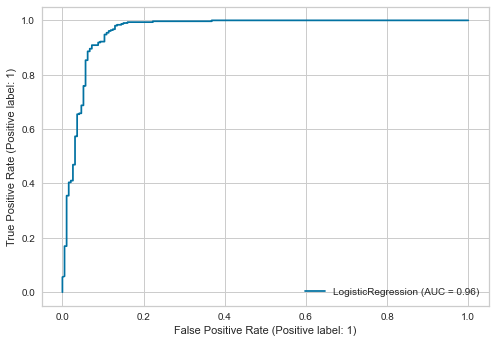

In [98]:
plot_roc_curve(log_model, X_test_scaled, y_test, response_method='auto');

# true positive rate demek "recall" demek. yani gerçekte 1 lerin yüzde kaçını bildim.

# false positive rate ise 0 ların yüzde kaçını bilemedim.

In [99]:
# roc_auc_score, proba ile çiziliyor. (olasılık değerleri ile çiziliyor)

roc_auc_score(y_test, y_pred_proba[:,1])

0.9630132824762451

In [100]:
roc_auc_score(y_test, y_pred)

0.9227945519906837

In [107]:
fp_rate, tp_rate, thresholds = roc_curve(y_test, y_pred_proba[:,1])

# yukardaki grafikteki her noktada threshold değerini bana veriyor.

In [108]:
#benim true pos. rate lerimden false pos. rate leri çıkarttığımda en yüksek değer ne ise, yani 1 leri bilme olasılığının en 
#yüksek olduğu yer ile 0 ları bilemediğim yerlerin en düşük olduğu yerler arasındaki farkın en yüksek olduğu indeksi bana çıkartıyor.

optimal_idx = np.argmax(tp_rate - fp_rate)
optimal_threshold = thresholds[optimal_idx]
optimal_threshold

# Bu threshold değeri bana şunu anlatıyor: 0.5 yerine 0.41 üzerini 1 alıp altını 0 alsaydım daha doğru sonuçlar alacaktım..

0.4124560000328866

In [109]:
roc_curve = {"fp_rate":fp_rate, "tp_rate":tp_rate, "thresholds":thresholds}
df_roc_curve = pd.DataFrame(roc_curve)
df_roc_curve

,fp_rate,tp_rate,thresholds
0,0.000,0.000,2.000
1,0.000,0.003,1.000
2,0.000,0.055,0.999
3,0.005,0.059,0.999
4,0.005,0.169,0.996
...,...,...,...
86,0.368,0.997,0.069
87,0.368,1.000,0.066
88,0.373,1.000,0.066
89,0.383,1.000,0.061


In [110]:
# yukardaki yaptığım işlemin aynısını alternatif yöntemle yapıyorum.

optimal_idx = np.argmax(df_roc_curve.tp_rate - df_roc_curve.fp_rate)
optimal_threshold = df_roc_curve.thresholds[optimal_idx]
optimal_threshold

0.4124560000328866

In [111]:
df_roc_curve.iloc[optimal_idx]

#benim threshold değerimin 0.41 olduğu yerdeki değerlerim aşağıda olduğu gibiymiş.

fp_rate      0.130
tp_rate      0.980
thresholds   0.412
Name: 73, dtype: float64

In [112]:
test_data.head()

,age,physical_score,test_result,pred_proba,pred
1718,39.000,37.800,1,0.976,1
2511,45.000,38.700,1,0.973,1
345,56.000,21.800,0,0.011,0
2521,40.000,44.000,1,0.998,1
54,64.000,25.400,0,0.025,0


In [113]:
test_data["pred2"] = test_data["pred_proba"].apply(lambda x : 1 if x >= optimal_threshold else 0)

# optimal_threshold değerinden büyük olanları 1 yap küçük olanları 0 yap.

In [114]:
test_data[(test_data["pred_proba"]>0.4) & (test_data["pred_proba"]<0.6)]

# optimum_threshol değerini manuel olarak 0.4 e çekerek daha doğru değerler almamı sağladım.

# mesela 618. indekste default olan 0.5 threshold değerine göre test_result'a karşılık (pred) 0  olarak yanlış tahmin etmişti. 
# ben threshold değerini optimum değere (0.41) çekince (pred2 de) bunun 1 olarak düzeltildiğini gördüm.

,age,physical_score,test_result,pred_proba,pred,pred2
618,63.000,33.400,1,0.454,0,1
3200,60.000,32.900,1,0.465,0,1
3731,57.000,31.900,1,0.422,0,1
480,41.000,28.600,0,0.410,0,0
1525,46.000,30.700,0,0.527,1,1
3209,61.000,32.600,1,0.412,0,1
172,54.000,32.500,1,0.549,1,1
1379,57.000,32.600,0,0.496,0,1
2415,58.000,33.100,1,0.528,1,1
133,55.000,31.900,0,0.464,0,1


In [115]:
print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test,y_pred))

[[172  21]
 [ 14 293]]
              precision    recall  f1-score   support

           0       0.92      0.89      0.91       193
           1       0.93      0.95      0.94       307

    accuracy                           0.93       500
   macro avg       0.93      0.92      0.93       500
weighted avg       0.93      0.93      0.93       500



In [116]:
y_pred2 = test_data["pred2"]

In [117]:
print(confusion_matrix(y_test,y_pred2))
print(classification_report(y_test,y_pred2))

# threshold düzeltmesi ile skorlarımı iyileştirdim. (Bu data gibi) balanst datalarda işte yarıyor ve hemen hemen tüm yanlış tahminleri düzeltiyor.

[[168  25]
 [  6 301]]
              precision    recall  f1-score   support

           0       0.97      0.87      0.92       193
           1       0.92      0.98      0.95       307

    accuracy                           0.94       500
   macro avg       0.94      0.93      0.93       500
weighted avg       0.94      0.94      0.94       500



In [ ]:
plot_precision_recall_curve(log_model, X_test_scaled, y_test);

# unbalanst datalarda plot_precision_recall_curve() kullanılması gerektiği söylenir.

## Final Model and Model Deployment

In [ ]:
scaler = StandardScaler().fit(X)

In [ ]:
import pickle
pickle.dump(scaler, open("scaler_hearing", 'wb'))

In [ ]:
X_scaled = scaler.transform(X)

In [ ]:
final_model = LogisticRegression().fit(X_scaled, y)

In [ ]:
pickle.dump(final_model, open("final_model_hearing", 'wb'))

In [ ]:
my_dict = {"age": [20, 30, 40, 50, 60],
           "physical_score": [50, 30, 20, 10, 5]}

In [ ]:
sample = pd.DataFrame(my_dict)
sample

# modelim bunları benden dataframe şeklinde bekliyor o yüzden dataframe e çevirdim.

In [ ]:
scaler_hearing = pickle.load(open("scaler_hearing", "rb"))

# modelim benden bunları scale edilmiş olarak bekliyor o yüzden scale ediyorum.

In [ ]:
sample_scaled = scaler_hearing.transform(sample)
sample_scaled

In [ ]:
final_model = pickle.load(open("final_model_hearing", "rb"))

In [ ]:
predictions = final_model.predict(sample_scaled)
predictions_proba = final_model.predict_proba(sample_scaled)

In [ ]:
sample["pred"] = predictions
sample["pred_proba"] = predictions_proba[:,1]
sample